In [1]:
import os
import random
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from PIL import Image, ImageDraw
import requests
from io import BytesIO

from tools.refer.refer import REFER
%matplotlib inline

In [2]:
task="refcoco"
split = "val"
dataroot="/home/kanishk/Documents/research/vilbert/vilbert-multi-task/data/datasets/refcoco/"

refer = REFER(dataroot, dataset=task, splitBy="unc")

loading dataset refcoco into memory...
creating index...
index created.
DONE (t=10.51s)


In [9]:
file_path = '/home/kanishk/Documents/research/vigil/vilbert_model/save/refcoco_Kl_Divergence-vilbert-02-06_04-42/eval.npy'
# file_path = '/home/kanishk/Documents/research/vigil/vilbert_model/save/refcoco_Kl_Divergence_blockgrid_14x14-vilbert-02-06_13-20/eval.npy'

In [10]:
data = torch.load(file_path)

In [11]:
eval_data = data['TASK9']
print(f'eval_data: length-{len(eval_data)}')
key = len(eval_data)

eval_data: length-20


In [12]:
if key == 20:
    key -= 1
vis_data = eval_data[-1][key]

In [13]:
examples = random.choices(vis_data, k=50)

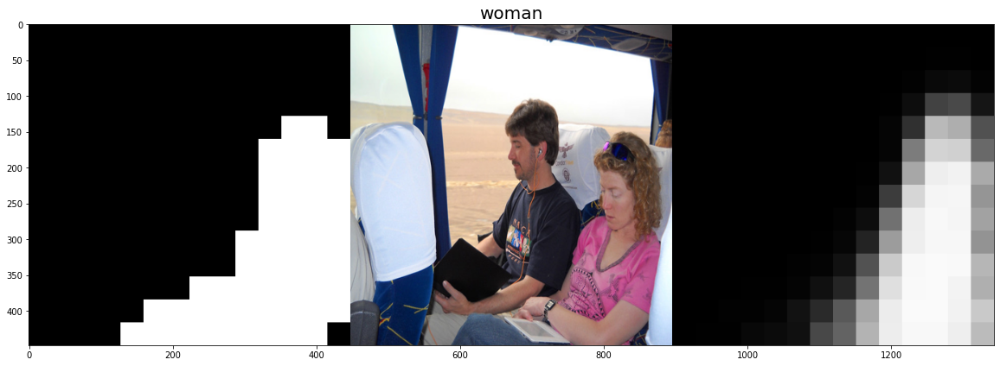

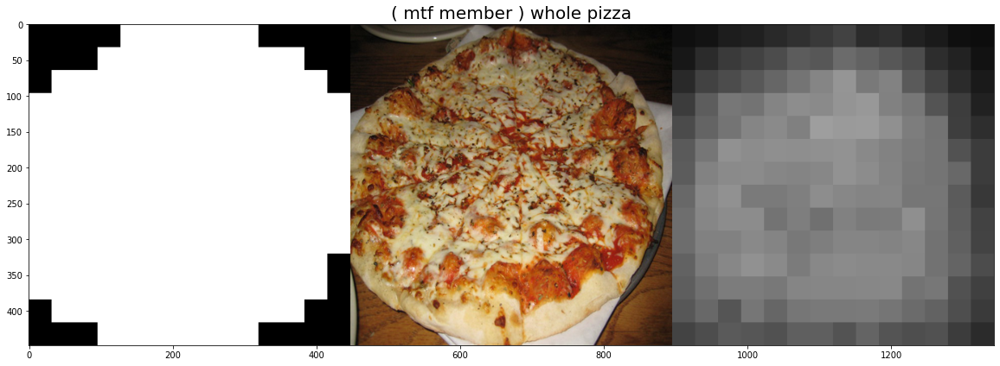

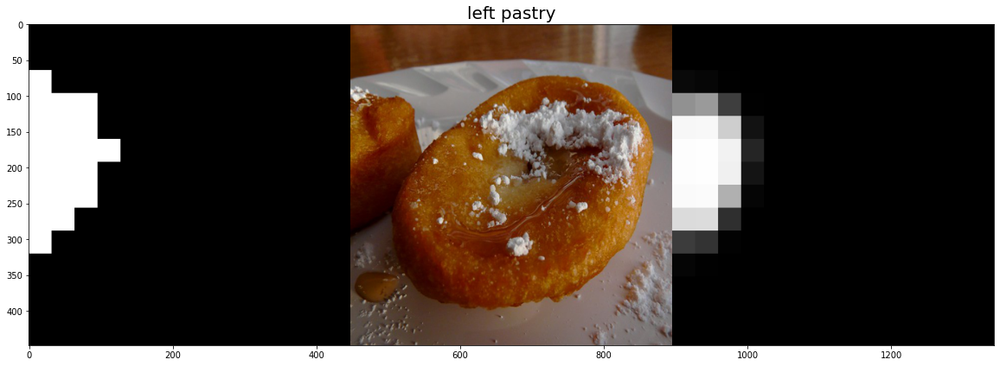

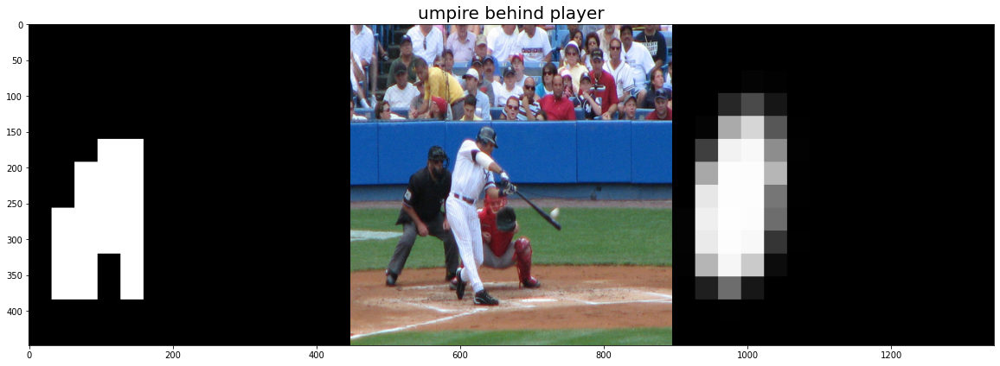

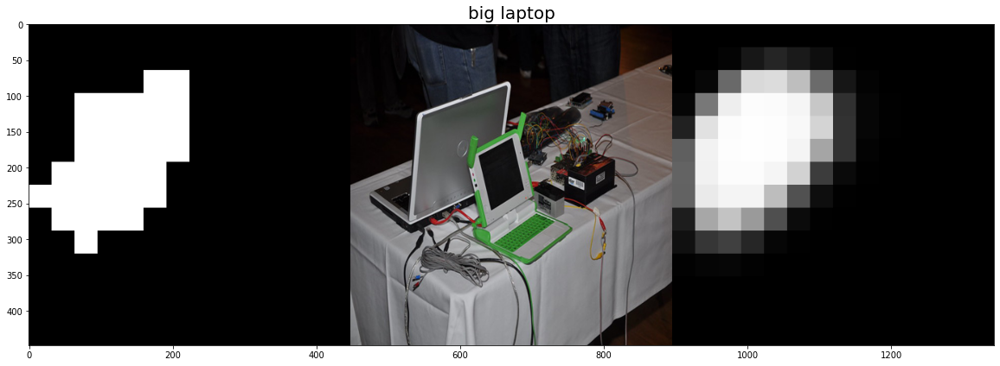

...

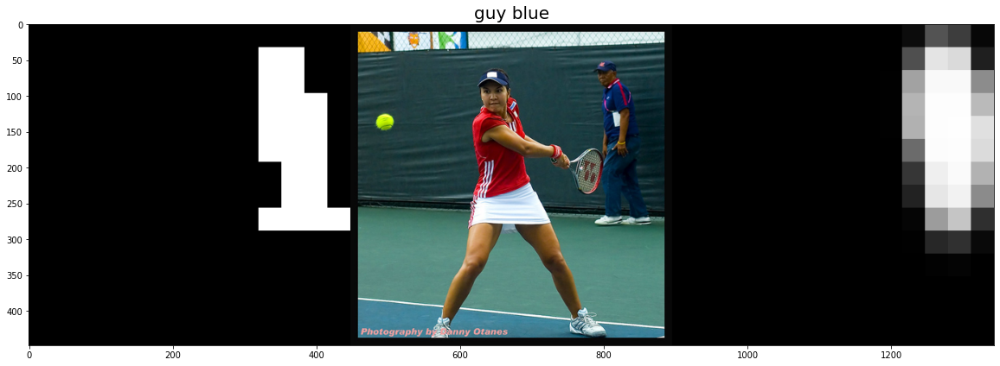

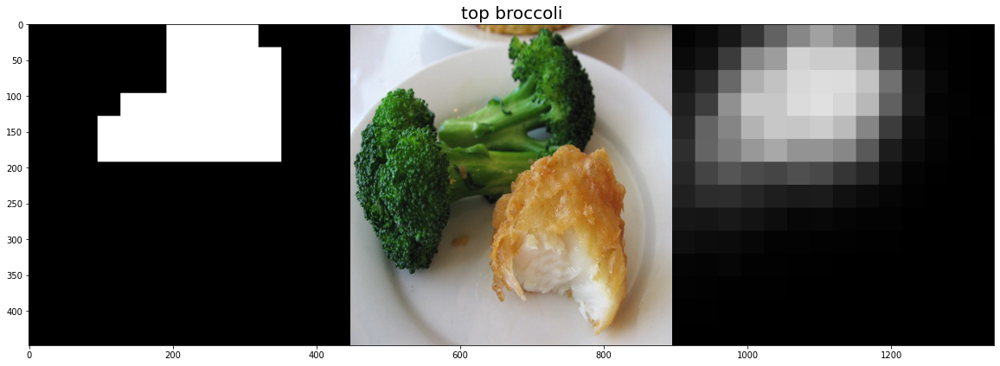

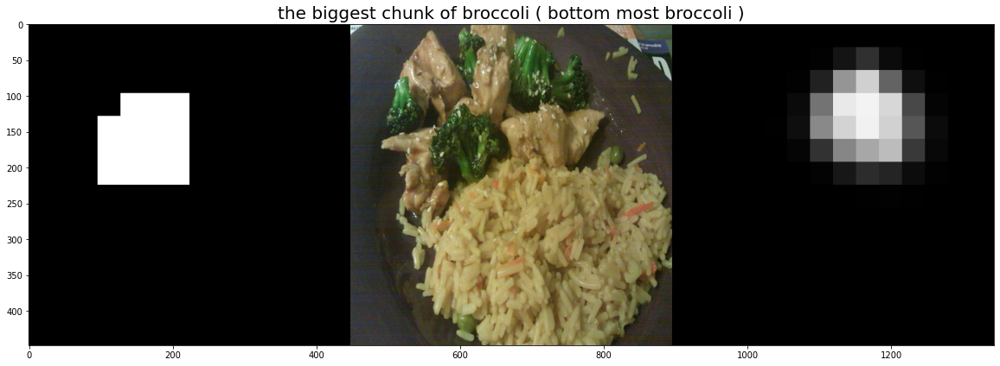

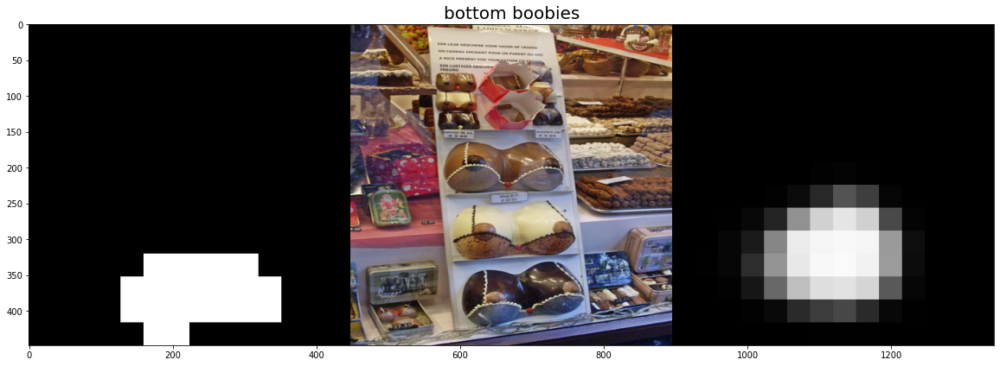

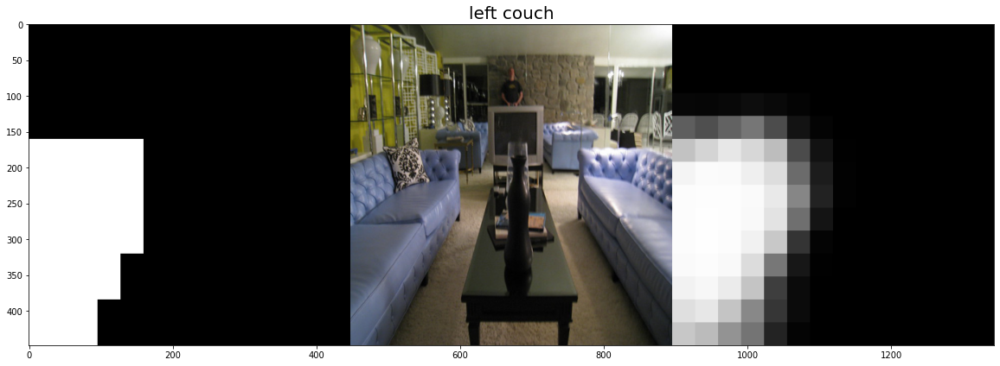

In [14]:
for example in examples:
    grid_gt = example['grid_gt'].reshape(14, 14)
    grid_pred = example['grid_pred'].reshape(14, 14)
    phrase = example['phrase']
    image_id = example['image_id']
    
    image = refer.Imgs[image_id]
    url = image['flickr_url']
    try: 
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img = img.resize((448, 448))


        grid_gt_img = np.zeros((448, 448))
        grid_pred_img = np.zeros((448, 448))

        for i in range(14):
            for j in range(14):
                grid_gt_img[32*i:32*i+32, 32*j:32*j+32] = grid_gt[j, i]
                grid_pred_img[32*i:32*i+32, 32*j:32*j+32] = grid_pred[j, i]

        #gt_img = Image.fromarray(np.uint8(grid_gt_img*255))
        #pred_img = Image.fromarray(np.uint8(grid_pred_img*255))
        
        #fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
        #ax[0].imshow(np.array(img))
        #ax[1].imshow(gt_img, cmap='gray')
        #ax[2].imshow(pred_img, cmap='gray')
        #plt.show()
        #print(f'phrase: {phrase}')
        
        gt_img = np.stack((np.uint8(grid_gt_img*255),)*3, axis=-1)
        pred_img = np.stack((np.uint8(grid_pred_img*255),)*3, axis=-1)
        
        final_img = np.hstack([gt_img, np.array(img), pred_img])

        fig = plt.figure(figsize=(20, 20))
        plt.imshow(final_img)
        plt.title(phrase, fontsize=20)
        plt.show()

    except:
        pass